# 🚀 New York City Airbnb Open Data

<img src="nyc.webp" width="100%"/>

### 🔥 Loading Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go

### 📚 EDA

In [2]:
df=pd.read_csv("AB_NYC_2019.csv")

In [3]:
df.sample(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
41474,32241096,Sonder | Stock Exchange | Sunny 1BR + Sofa Bed,219517861,Sonder (NYC),Manhattan,Financial District,40.70656,-74.01094,Entire home/apt,228,2,8,2019-05-29,2.12,327,343
15961,12902686,BayRidge Brooklyn Apartment,70686576,Fotini,Brooklyn,Fort Hamilton,40.61707,-74.03473,Entire home/apt,110,1,1,2016-06-23,0.03,1,0
40214,31193461,New York Private Room with a View,1276028,Marcia,Manhattan,Harlem,40.82765,-73.95012,Private room,80,3,6,2019-06-27,1.89,2,70
6541,4744276,Huge Room in First Floor Brownstone,24487418,Daniel,Brooklyn,Crown Heights,40.67318,-73.94842,Private room,75,2,19,2016-08-26,0.39,1,0
7563,5671922,Perfect Holiday House in NYC,1434654,Andrew,Queens,Ridgewood,40.70730,-73.91775,Entire home/apt,160,7,3,2016-08-13,0.06,2,15


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [5]:
df.shape

(48895, 16)

In [6]:
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

<AxesSubplot: xlabel='count', ylabel='neighbourhood_group'>

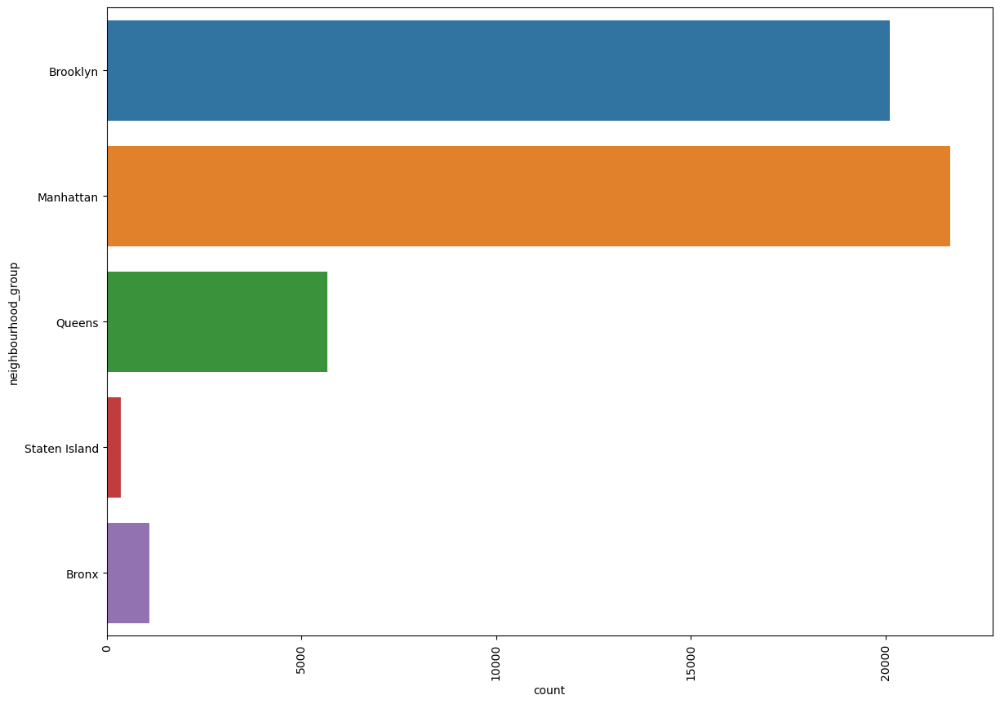

In [7]:
plt.figure(figsize=(14,10))
plt.xticks(rotation=90)
sns.countplot(data=df, y='neighbourhood_group')

In [8]:
df.neighbourhood.value_counts().head(10)

Williamsburg          3920
Bedford-Stuyvesant    3714
Harlem                2658
Bushwick              2465
Upper West Side       1971
Hell's Kitchen        1958
East Village          1853
Upper East Side       1798
Crown Heights         1564
Midtown               1545
Name: neighbourhood, dtype: int64

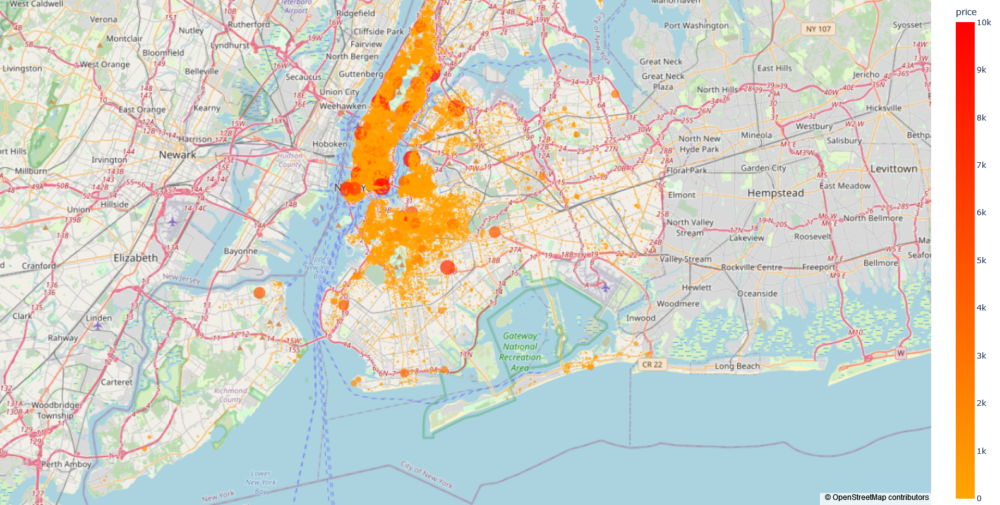

In [9]:
color_scale = [(0, 'orange'), (1,'red')]
fig = px.scatter_mapbox(df, 
                        lat="latitude", 
                        lon="longitude", 
                        hover_name="neighbourhood", 
                        hover_data=["host_name", "price"],
                        color="price",
                        color_continuous_scale=color_scale,
                        size="price",
                        zoom=8, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [10]:
df.nlargest(10,'number_of_reviews')

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
11759,9145202,Room near JFK Queen Bed,47621202,Dona,Queens,Jamaica,40.66730,-73.76831,Private room,47,1,629,2019-07-05,14.58,2,333
2031,903972,Great Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82085,-73.94025,Private room,49,1,607,2019-06-21,7.75,3,293
2030,903947,Beautiful Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82124,-73.93838,Private room,49,1,597,2019-06-23,7.72,3,342
2015,891117,Private Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82264,-73.94041,Private room,49,1,594,2019-06-15,7.57,3,339
13495,10101135,Room Near JFK Twin Beds,47621202,Dona,Queens,Jamaica,40.66939,-73.76975,Private room,47,1,576,2019-06-27,13.40,2,173
10623,8168619,Steps away from Laguardia airport,37312959,Maya,Queens,East Elmhurst,40.77006,-73.87683,Private room,46,1,543,2019-07-01,11.59,5,163
1879,834190,Manhattan Lux Loft.Like.Love.Lots.Look !,2369681,Carol,Manhattan,Lower East Side,40.71921,-73.99116,Private room,99,2,540,2019-07-06,6.95,1,179
20403,16276632,Cozy Room Family Home LGA Airport NO CLEANING FEE,26432133,Danielle,Queens,East Elmhurst,40.76335,-73.87007,Private room,48,1,510,2019-07-06,16.22,5,341
4870,3474320,Private brownstone studio Brooklyn,12949460,Asa,Brooklyn,Park Slope,40.67926,-73.97711,Entire home/apt,160,1,488,2019-07-01,8.14,1,269
471,166172,LG Private Room/Family Friendly,792159,Wanda,Brooklyn,Bushwick,40.70283,-73.92131,Private room,60,3,480,2019-07-07,6.70,1,0


<AxesSubplot: xlabel='count', ylabel='room_type'>

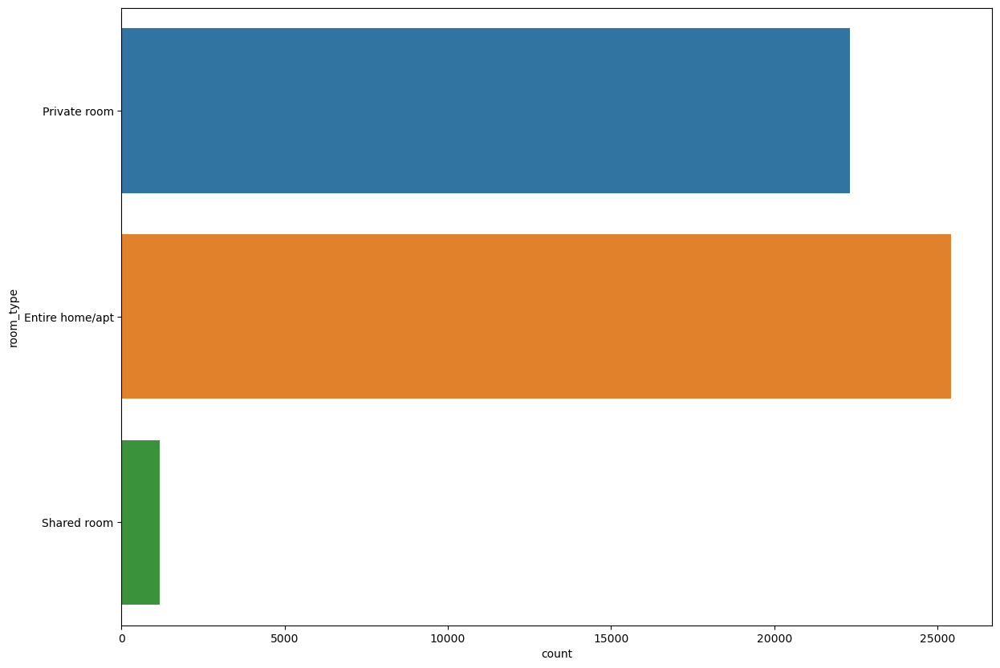

In [11]:

plt.figure(figsize=(14,10))
sns.countplot(data=df, y='room_type')

In [12]:
### Machine Learning

In [13]:
df.drop(["id","host_id","host_name","name",'last_review',"latitude",'longitude'], axis=1, inplace=True)
df.isnull().sum()

neighbourhood_group                   0
neighbourhood                         0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [14]:
mean = df['reviews_per_month'].mean()
df['reviews_per_month'].fillna(mean, inplace=True)
df.isnull().sum()

neighbourhood_group               0
neighbourhood                     0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

[(11.0, 0.0)]

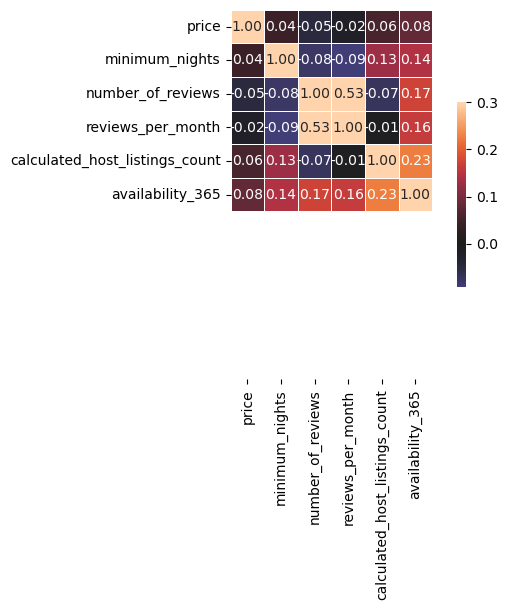

In [15]:
sns.heatmap(df.corr(), annot=True, fmt=".2f", vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}).set(ylim=(11, 0))

In [16]:
abs(df.corr()["price"]).sort_values(ascending=False)

price                             1.000000
availability_365                  0.081829
calculated_host_listings_count    0.057472
number_of_reviews                 0.047954
minimum_nights                    0.042799
reviews_per_month                 0.022373
Name: price, dtype: float64

In [17]:
def regression_funct(x,y):
    from sklearn.linear_model import LinearRegression
    from sklearn.linear_model import Ridge,Lasso
    from sklearn.linear_model import ElasticNet
    from sklearn.tree import ExtraTreeRegressor
    from sklearn.ensemble import GradientBoostingRegressor
    from sklearn.neighbors import KNeighborsRegressor
    
    from sklearn.model_selection import train_test_split

    from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error
    
    
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

    L=LinearRegression()
    R=Ridge()
    Lass=Lasso()
    E=ElasticNet()
    ExTree=ExtraTreeRegressor()
    GBR=GradientBoostingRegressor()
    KN=KNeighborsRegressor()
    
    algos=[L,R,Lass,E,ExTree,GBR,KN]
    algo_names=['LinearRegression','Ridge','Lasso','ElasticNet','ExtraTreeRegressor','GradientBoostingRegressor','KNeighborsRegressor']
    r_squared=[]
    rmse=[]
    mae=[]
    
    result=pd.DataFrame(columns=['R_Squared','RMSE','MAE'],index=algo_names)
    
    for item in algos:
        item.fit(x_train,y_train)
        item.predict(x_test)
        r_squared.append(r2_score(y_test,item.predict(x_test)))
        rmse.append((mean_squared_error(y_test,item.predict(x_test)))**.5)
        mae.append(mean_absolute_error(y_test,item.predict(x_test)))
        
    result.R_Squared=r_squared
    result.RMSE=rmse
    result.MAE=mae
        
    return result.sort_values('R_Squared',ascending=False)

In [22]:
df=pd.get_dummies(df,drop_first=True)

In [23]:
x=df.drop("price",axis=1,)
y=df[["price"]]

In [24]:
x

,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,neighbourhood_Arden Heights,...,neighbourhood_Williamsbridge,neighbourhood_Williamsburg,neighbourhood_Willowbrook,neighbourhood_Windsor Terrace,neighbourhood_Woodhaven,neighbourhood_Woodlawn,neighbourhood_Woodrow,neighbourhood_Woodside,room_type_Private room,room_type_Shared room
0,1,9,0.210000,6,365,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,1,45,0.380000,2,355,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,0,1.373221,1,365,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,1,270,4.640000,1,194,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,10,9,0.100000,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,2,0,1.373221,2,9,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
48891,4,0,1.373221,2,36,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
48892,10,0,1.373221,1,27,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
48893,1,0,1.373221,6,2,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [26]:
regression_funct(x,y)

C:\Users\BA\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:494: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



,R_Squared,RMSE,MAE
GradientBoostingRegressor,1.726747e-01,1.913097e+02,64.373229
Ridge,1.366282e-01,1.954330e+02,68.078614
Lasso,1.229336e-01,1.969768e+02,69.234491
ElasticNet,6.903306e-02,2.029392e+02,78.386362
KNeighborsRegressor,-1.146374e-01,2.220576e+02,86.050046
ExtraTreeRegressor,-1.001531e+00,2.975638e+02,81.532276
LinearRegression,-2.109300e+11,9.659799e+07,976902.358187
